In [ ]:
#!unzip /content/drive/MyDrive/dog-vision-colab/data/dog-breed-identification.zip -d /content/drive/MyDrive/dog-vision-colab/data

In [ ]:
# copy python file with utils functions
!cp /content/drive/MyDrive/dog-vision-colab/utils_tensorflow.py .

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.6 and TensorFlow Hub.



# 1. Problem definition

Identifying the bread of a dog given an image of a dog.



# 2. Data 

Source of a data: 
https://www.kaggle.com/c/dog-breed-identification/data

# 3. Evaluation

Model will be evaluated on using Accuracy, Precision, Recall, F1 Score..



# 4. Features

In this project we are going to deal with an unstructured data in form of a images. We are going to use deep/transfer learning.

Some info about data:
* There are 120 breeds of dogs.
* There around 10,000+ images in the training set. (with labels)
* There around 10,000+ images in the test set. (without labels, we want to predict them)

Get workspace ready
* Import TensorFlow 2.6 
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# import tools
import tensorflow as tf
print("TensorFLow version:", tf.__version__)

import tensorflow_hub as hub
print("TensorFLow Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TensorFLow version: 2.6.0
TensorFLow Hub version: 0.12.0
GPU available


In [ ]:
!nvidia-smi

Tue Sep  7 08:26:28 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    31W / 149W |      3MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Getting our data data ready

Since since we our data is in form of a images, we have to convert them into numerical representations

In [ ]:
# access the labels
import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/dog-vision-colab/data/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


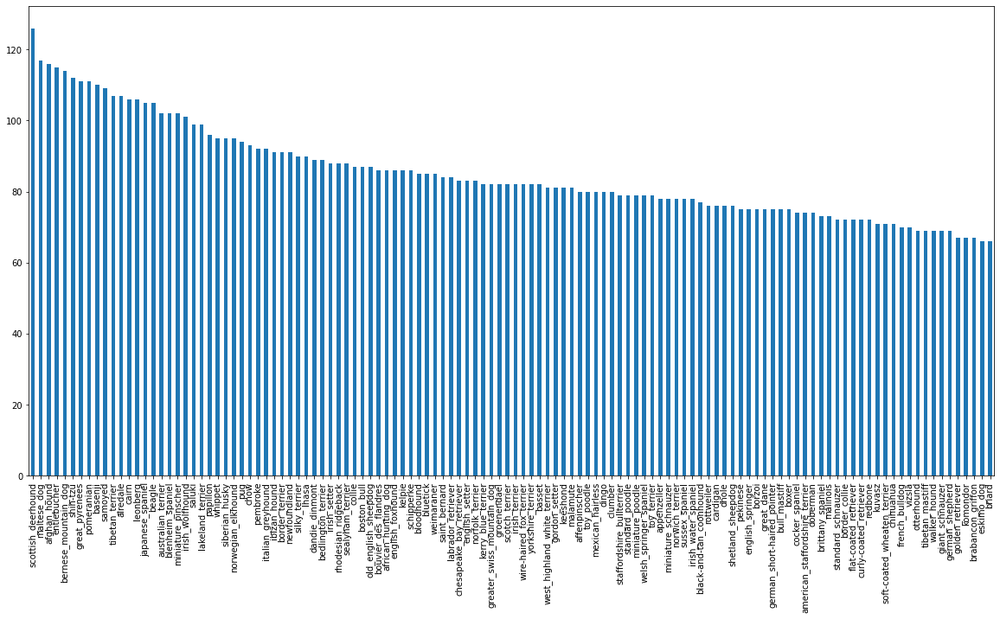

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

### Getting images and their labels

In [ ]:
# Create pathnames from images ID's
filepaths = [f"/content/drive/MyDrive/dog-vision-colab/data/train/{fname}.jpg" for fname in labels_csv["id"]]

filepaths[:5]

['/content/drive/MyDrive/dog-vision-colab/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os

if len(os.listdir("/content/drive/MyDrive/dog-vision-colab/data/train")) == len(filepaths):
  print("Data should be OK")
else:
  print("Something wrong with the data. Number of labels don't match actual amount of files")

Data should be OK


Prepare the labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels[:5]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check whether number of labels matches filepaths
if len(labels) == len(filepaths):
  print("Data should be OK")
else:
  print("Something wrong with the data. Number of labels don't match actual amount of files")

Data should be OK


In [ ]:
# Check number of unique labels. According to the data source should be 120 unique labels (breads)
unique_breads = np.unique(labels)
len(unique_breads)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breads

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# We are going to encode labels like in example above
boolean_labels = [label == unique_breads for label in labels]
len(boolean_labels)

10222

### Creating validation set
Since the data set from Kaggle doesn't come with a validation set, we're going to create our own

In [ ]:
# Setup X & y variables
X = filepaths
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10222}

In [ ]:
# Let's split our data into train and validations sets
from sklearn.model_selection import train_test_split

# Split them into training and validation set of total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES],
                                                  test_size=0.2, random_state=42)

In [ ]:
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

### Preprocessing Images (turning images into Tensors)


### Turn data into bathes with size of 32

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples

In [ ]:
IMG_SIZE = 224

from utils_tensorflow import create_data_batches
training_data = create_data_batches(X_train, y_train, img_size=(IMG_SIZE,IMG_SIZE))
val_data = create_data_batches(X_val, y_val, valid_data=True, img_size=(IMG_SIZE,IMG_SIZE))

Creating Training  data batches...
Creating validation data batches...


In [ ]:
type(training_data), type(val_data)

(tensorflow.python.data.ops.dataset_ops.BatchDataset,
 tensorflow.python.data.ops.dataset_ops.BatchDataset)

### Visualizing Data Batches

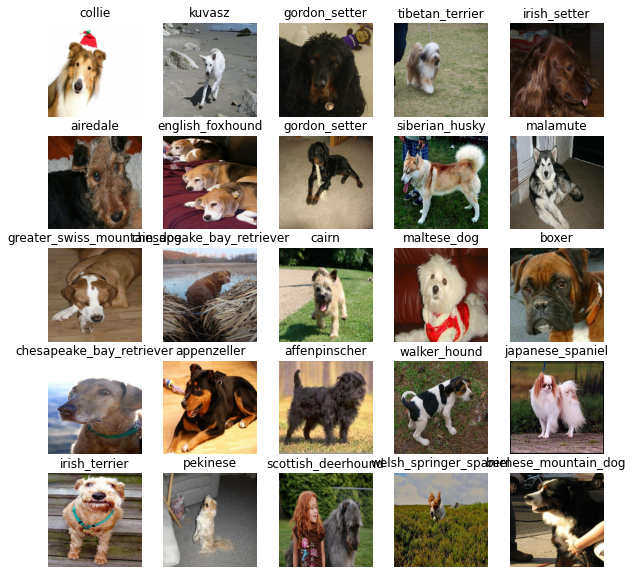

In [ ]:
import matplotlib.pyplot as plt
from utils_tensorflow import show_images

# show images from a first batch
images, labels = next(training_data.as_numpy_iterator())
show_images(images, labels, unique_breads, 25)

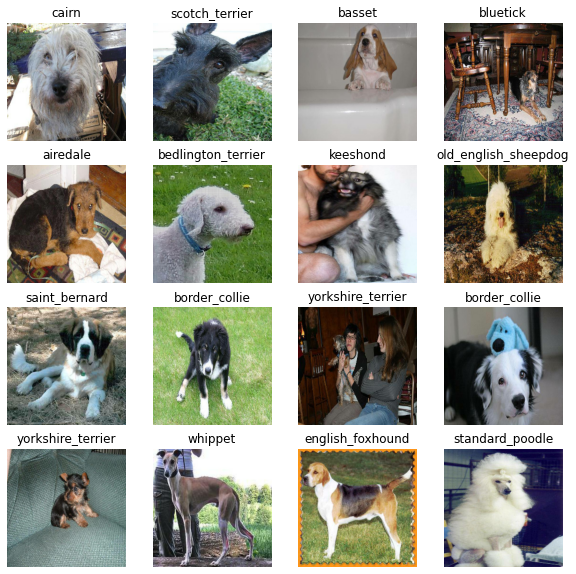

In [ ]:
# do the same for a validation set
images_2, labels_2 = next(val_data.as_numpy_iterator())
show_images(images_2, labels_2, unique_breads, 16)

# Building a model

Before we build a model, there are a few things we need to define:
* The input shape to our model
* Output shape of our model
* The URL of the model we want to use for transfer learning - https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/classification/5


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output of our model
OUTPUT_SHAPE = len(unique_breads)

# Setup model URL from TensorFlow Hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5"

Puting those three into Keras sequential deep learning model. Steps are defined in docs:
https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
from utils_tensorflow import create_model
model = create_model(INPUT_SHAPE, OUTPUT_SHAPE, MODEL_URL)
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              4013897   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 4,134,137
Trainable params: 120,240
Non-trainable params: 4,013,897
_________________________________________________________________


### Creating callbacks
Callbacks are helper functions a model can use during training to do such a things as save its progress, checks its progress, or stop treaining early if a model is not improving anymore.

I'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long. Both of them will be in an utils_tensorflow.py file.C

Tensorboard callback

To setup tensorboard, we need do to 3 things:
1. Load the TensorBoard notebook extension
2. Create callback which is able to save logs and pass it to out model's `fit()` function.
3. Visualise out models traning logs with the `%tensorboard` magic function, after model training.


In [ ]:
# Load tensorBoard notebook extension
%load_ext tensorboard

In [ ]:
from utils_tensorflow import create_tensorboard_callback
ts_board_callback = create_tensorboard_callback()

### Early stoping callback
Early stopping helps stop our model from overfitting by stoping training if a certain evaluation metrics stop improving

In [ ]:
# crete early stoping callback
early_stoping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy"
    , patience=3)

## Training a model on a subset

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider" ,min:10, max:100, step:10}

Creating a function that will:
* Create a model using `create_model()` 
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data, validaion data, number of epochs and the callbacks.
* Return the model

In [ ]:
# callbacks
callbacks= (ts_board_callback, early_stoping)
# import written function
from utils_tensorflow import train_model

# Fit the model to the data
model = train_model(training_data, val_data,
                    INPUT_SHAPE, OUTPUT_SHAPE,
                    MODEL_URL, NUM_EPOCHS,
                    callbacks)

Building model with https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5
Epoch 1/100
25/25 [==============================] - 113s 3s/step - loss: 4.8660 - accuracy: 0.0737 - val_loss: 3.8994 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 4s 177ms/step - loss: 1.8579 - accuracy: 0.6325 - val_loss: 2.6703 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 4s 158ms/step - loss: 0.6442 - accuracy: 0.9237 - val_loss: 2.1761 - val_accuracy: 0.5100
Epoch 4/100
25/25 [==============================] - 4s 175ms/step - loss: 0.2646 - accuracy: 0.9887 - val_loss: 1.9934 - val_accuracy: 0.5400
Epoch 5/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1415 - accuracy: 1.0000 - val_loss: 1.9201 - val_accuracy: 0.5450
Epoch 6/100
25/25 [==============================] - 4s 177ms/step - loss: 0.0945 - accuracy: 1.0000 - val_loss: 1.8757 - val_accuracy: 0.5600
Epoch 7/100
25/25 [==========================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created ealier and visualize its content.


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision-colab/logs

Output hidden; open in https://colab.research.google.com to view.

### Making and evaluating prediction using a trained model


In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 105ms/step


array([[5.17237349e-04, 1.08617336e-04, 7.02332691e-05, ...,
        2.92467041e-04, 1.91995539e-04, 1.25616314e-02],
       [5.15014435e-05, 1.40184828e-03, 2.86898413e-03, ...,
        6.20055289e-05, 3.06884351e-04, 1.76794965e-05],
       [1.19978802e-06, 2.89536479e-06, 4.48254286e-06, ...,
        2.84460093e-05, 2.35330305e-07, 2.33586843e-06],
       ...,
       [6.88310092e-06, 3.27745802e-04, 1.52589037e-05, ...,
        2.60620109e-05, 3.13698220e-05, 2.11798415e-05],
       [5.74916089e-03, 1.29454231e-04, 1.96791425e-05, ...,
        2.44829542e-04, 1.97868721e-04, 5.76530024e-03],
       [2.74516409e-04, 7.28798623e-05, 4.77298768e-03, ...,
        2.78695463e-03, 4.05904185e-03, 2.54058489e-03]], dtype=float32)

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breads[np.argmax(predictions[index])]}")

[5.17237349e-04 1.08617336e-04 7.02332691e-05 8.16420012e-04
 9.11951705e-04 5.47323434e-05 8.98218621e-03 9.35913646e-04
 6.49858266e-03 9.71075497e-05 1.53396605e-03 8.22818474e-05
 7.47807790e-05 2.86876020e-04 1.67476502e-03 1.62124215e-03
 6.41416727e-06 1.22773685e-02 5.05406133e-05 1.69097839e-04
 1.13973918e-03 4.97731206e-04 3.04075977e-04 1.37317982e-02
 7.97280227e-05 9.38379017e-05 8.91178753e-03 7.63307558e-04
 7.38584713e-05 5.60091203e-03 6.66629858e-05 9.29134898e-04
 4.21037868e-04 4.61140298e-04 2.78464358e-05 2.00191475e-02
 3.84250779e-05 1.68676977e-03 2.63378752e-04 3.91708250e-04
 9.96536692e-05 1.18407814e-04 1.30723506e-01 5.53045713e-04
 1.14771523e-04 3.00590818e-05 2.77613199e-05 4.04254155e-04
 2.42971093e-03 3.79887671e-04 4.88055557e-05 2.61615642e-04
 6.81458181e-03 2.01579602e-03 4.52397042e-04 4.64427612e-05
 1.17466749e-04 4.13203612e-03 1.12585723e-04 8.39831159e-02
 1.24788668e-04 7.60766416e-05 5.18052373e-04 1.87292710e-04
 1.02884299e-03 1.841805

Now let's make it at scale and visualize predictions

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
from utils_tensorflow import get_pred_label

# Get a predicted label based on an array of prediction probabilities
get_pred_label(predictions[0], unique_breads)

'soft-coated_wheaten_terrier'

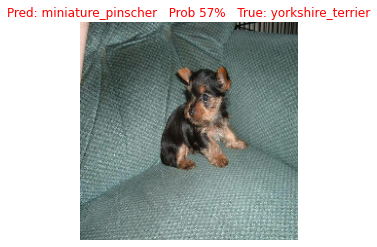

In [ ]:
# function to unbatch data set
from utils_tensorflow import unbatch_dataset

# Unbatchify the validation data
val_images, val_labels = unbatch_dataset(val_data, unique_breads)

# Function to plot single prediction
from utils_tensorflow import plot_pred

plot_pred(predictions, val_images, val_labels, unique_breads, 12)

Function for ploting prediction confidence



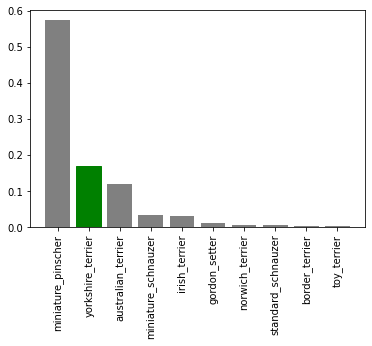

In [ ]:
from utils_tensorflow import plot_pred_conf

plot_pred_conf(predictions, val_labels, unique_breads, 12)

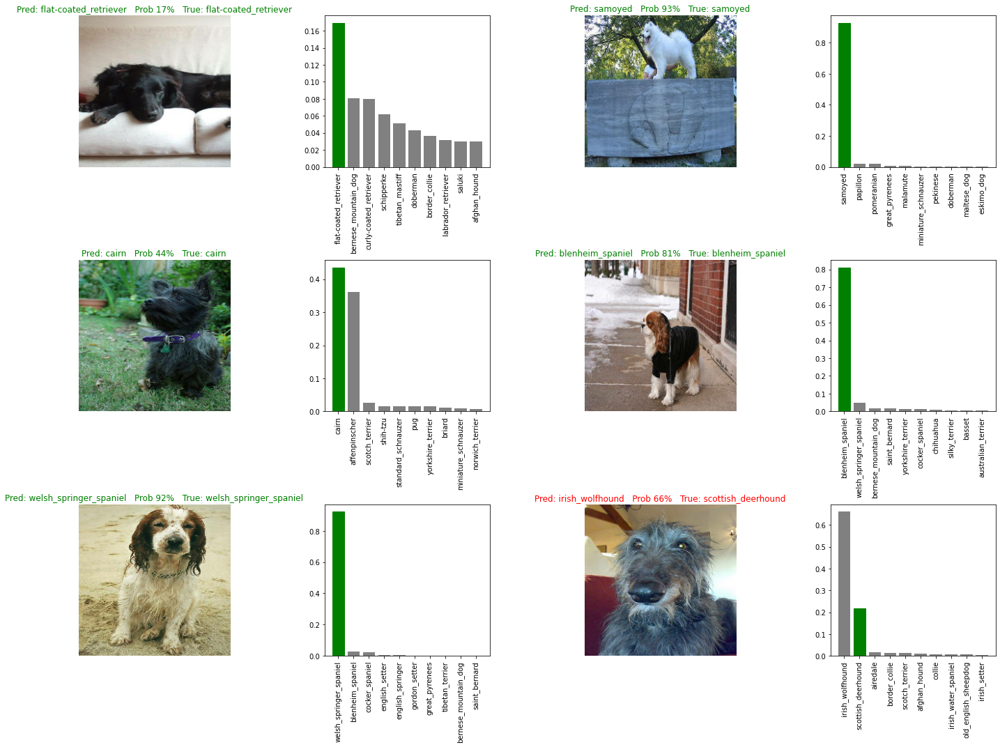

In [ ]:
# use that function to plot few predictions
i_multiplier = 20
num_rows = 3 
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,val_images, val_labels, unique_breads, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, unique_breads, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Create confusion matrix


In [ ]:
# Get all predicted labels
pred_labels = []

for pred in predictions:
  pred_labels.append(get_pred_label(pred, unique_breads))

from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(val_labels, pred_labels)

# make a plot
import seaborn as sns
fig, ax = plt.subplots(figsize=(len(pred_labels), len(pred_labels)))
ax = sns.heatmap(conf_mat, annot=True, linewidths=0.5, fmt=".2f", cmap="YlGnBu")

## Saving a model

In [ ]:
# Function to save a model
from utils_tensorflow import save_model

dir_path = "/content/drive/MyDrive/dog-vision-colab/models"
model_path = save_model(model, dir_path, "subsample1000-mobilenetv3Large_075_224-Adam")

Saving model to: /content/drive/MyDrive/dog-vision-colab/models/2021-09-03--08:19:40-subsample1000-mobilenetv3Large_075_224-Adam.h5...


## Load model

In [ ]:
# Function to load a model
from utils_tensorflow import load_model

loaded_model = load_model(model_path)

Loading saved model from: /content/drive/MyDrive/dog-vision-colab/models/2021-09-03--08:19:40-subsample1000-mobilenetv3Large_075_224-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 115ms/step - loss: 1.7655 - accuracy: 0.6100


[1.7654528617858887, 0.6100000143051147]

In [ ]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 2s 107ms/step - loss: 1.7655 - accuracy: 0.6100


[1.7654528617858887, 0.6100000143051147]

Yup, they are the same.

## Training model on a full data set

In [ ]:
# Create a data batches with the full data set

X_train, X_val, y_train, y_val = train_test_split(X, y,
                                                  test_size=0.15, random_state=42)

train_data = create_data_batches(X_train, y_train, img_size=(IMG_SIZE,IMG_SIZE))
val_data = create_data_batches(X_val, y_val,valid_data=True, img_size=(IMG_SIZE, IMG_SIZE))

Creating Training  data batches...
Creating validation data batches...


In [ ]:
# create a model and train it
full_model = train_model(train_data, val_data, INPUT_SHAPE, OUTPUT_SHAPE, MODEL_URL, 10000, callbacks)

Building model with https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5
Epoch 1/10000
272/272 [==============================] - 834s 3s/step - loss: 1.6739 - accuracy: 0.5945 - val_loss: 0.8613 - val_accuracy: 0.7503
Epoch 2/10000
272/272 [==============================] - 44s 161ms/step - loss: 0.4782 - accuracy: 0.8613 - val_loss: 0.8268 - val_accuracy: 0.7568
Epoch 3/10000
272/272 [==============================] - 40s 145ms/step - loss: 0.2612 - accuracy: 0.9306 - val_loss: 0.8194 - val_accuracy: 0.7640
Epoch 4/10000
272/272 [==============================] - 40s 145ms/step - loss: 0.1529 - accuracy: 0.9696 - val_loss: 0.8141 - val_accuracy: 0.7634
Epoch 5/10000
272/272 [==============================] - 39s 145ms/step - loss: 0.0992 - accuracy: 0.9864 - val_loss: 0.8268 - val_accuracy: 0.7673
Epoch 6/10000
272/272 [==============================] - 39s 145ms/step - loss: 0.0682 - accuracy: 0.9939 - val_loss: 0.8448 - val_accuracy: 0.7660
Epoch 7/10000
27

In [ ]:
# save model
full_model_path = save_model(full_model, dir_path, "fulldata-mobilenetv3Large_075_224-Adam")

Saving model to: /content/drive/MyDrive/dog-vision-colab/models/2021-09-03--09:26:50-fulldata-mobilenetv3Large_075_224-Adam.h5...


Model still has only 77% of accuracy on validation set (which is 15% of train data). Let's augment our data set, because why the heck not.

# 6. Experimentation

## Getting more data

Im going use data from following sources:

Aditya Khosla, Nityananda Jayadevaprakash, Bangpeng Yao and Li Fei-Fei. Novel dataset for Fine-Grained Image Categorization. First Workshop on Fine-Grained Visual Categorization (FGVC), IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2011. [pdf] [poster] [BibTex] 

J. Deng, W. Dong, R. Socher, L.-J. Li, K. Li and L. Fei-Fei, ImageNet: A Large-Scale Hierarchical Image Database. IEEE Computer Vision and Pattern Recognition (CVPR), 2009. [pdf] [BibTex]

Data set is pusblished on Kaggle:
https://www.kaggle.com/jessicali9530/stanford-dogs-dataset


In [ ]:
# !unzip /content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation/archive.zip -d /content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation

In [ ]:
# Get path names and labels 
import os

images_folder_path = "/content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation/images/Images"
labels_aug = []
filepaths_aug = []

for folder in os.listdir(images_folder_path):
  class_folder_path = os.path.join(images_folder_path, folder)
  for image in os.listdir(class_folder_path):
    labels_aug.append(folder[10:].casefold())
    filepaths_aug.append(os.path.join(class_folder_path, image))

In [ ]:
labels_aug[:5]

['chihuahua', 'chihuahua', 'chihuahua', 'chihuahua', 'chihuahua']

In [ ]:
filepaths_aug[:5]

['/content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation/images/Images/n02085620-Chihuahua/n02085620_574.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation/images/Images/n02085620-Chihuahua/n02085620_9414.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation/images/Images/n02085620-Chihuahua/n02085620_4266.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation/images/Images/n02085620-Chihuahua/n02085620_2921.jpg',
 '/content/drive/MyDrive/dog-vision-colab/data/data_for_augmentation/images/Images/n02085620-Chihuahua/n02085620_2208.jpg']

In [ ]:
if len(labels_aug) == len(filepaths_aug):
  print("Data should be ok")
else:
  print("Number of labels don't match number of filepaths")

Data should be ok


Create pandas data frame from labels and filepaths, then shuffle it because now images are group by class name becasue each class in this dataset has been located in the same folder.

In [ ]:
import pandas as pd
df_aug = pd.DataFrame({"labels":labels_aug, "filepaths":filepaths_aug})
df_aug = df_aug.sample(frac=1.0, random_state=42)

In [ ]:
df_aug.head()

,labels,filepaths
16226,great_dane,/content/drive/MyDrive/dog-vision-colab/data/d...
3388,borzoi,/content/drive/MyDrive/dog-vision-colab/data/d...
20011,mexican_hairless,/content/drive/MyDrive/dog-vision-colab/data/d...
1427,toy_terrier,/content/drive/MyDrive/dog-vision-colab/data/d...
19697,miniature_poodle,/content/drive/MyDrive/dog-vision-colab/data/d...


In [ ]:
len(df_aug.labels.value_counts()) # we the same ammount of classes in this dataset as in original

120

Now, create DataFrame for original data and combine append it to augmentation dataset

In [ ]:
df = pd.DataFrame({"labels":labels, "filepaths":filepaths})

In [ ]:
combined_df = pd.concat([df_aug, df])

In [ ]:
combined_df.head()

,labels,filepaths
16226,great_dane,/content/drive/MyDrive/dog-vision-colab/data/d...
3388,borzoi,/content/drive/MyDrive/dog-vision-colab/data/d...
20011,mexican_hairless,/content/drive/MyDrive/dog-vision-colab/data/d...
1427,toy_terrier,/content/drive/MyDrive/dog-vision-colab/data/d...
19697,miniature_poodle,/content/drive/MyDrive/dog-vision-colab/data/d...


In [ ]:
len(combined_df)

30802

In [ ]:
len(combined_df.labels.value_counts())

120

Looks like both datasets have the same number of classes. Most likely original data set was based on this data set. 

Next step will be to preprocess data and split into test and validation sets of batches

In [ ]:
import numpy as np
unique_breads = np.unique(df["labels"])

In [ ]:
len(unique_breads)

120

In [ ]:
# encode labels to booleans
boolean_labels = [label == unique_breads for label in combined_df["labels"] ]

In [ ]:
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
bool_labels_df = combined_df
bool_labels_df["labels"] = boolean_labels
bool_labels_df.head()

,labels,filepaths
16226,"[False, False, False, False, False, False, Fal...",/content/drive/MyDrive/dog-vision-colab/data/d...
3388,"[False, False, False, False, False, False, Fal...",/content/drive/MyDrive/dog-vision-colab/data/d...
20011,"[False, False, False, False, False, False, Fal...",/content/drive/MyDrive/dog-vision-colab/data/d...
1427,"[False, False, False, False, False, False, Fal...",/content/drive/MyDrive/dog-vision-colab/data/d...
19697,"[False, False, False, False, False, False, Fal...",/content/drive/MyDrive/dog-vision-colab/data/d...


In [ ]:
# Split data into X and y
X = list(bool_labels_df["filepaths"].to_numpy())
y = list(bool_labels_df["labels"].to_numpy())

In [ ]:
# create train and test validation splits
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y,
                                                  test_size=0.1, random_state=42)

Creating batches

In [ ]:
IMG_SIZE = 224

from utils_tensorflow import create_data_batches
training_data = create_data_batches(X_train, y_train, img_size=(IMG_SIZE,IMG_SIZE))
val_data = create_data_batches(X_val, y_val, valid_data=True, img_size=(IMG_SIZE,IMG_SIZE))

Creating Training  data batches...
Creating validation data batches...


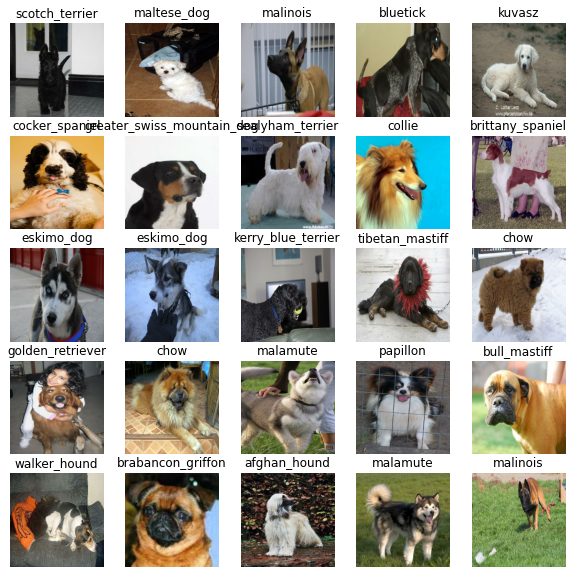

In [ ]:
# Simple visualisation for to see if batches are working
import matplotlib.pyplot as plt
from utils_tensorflow import show_images

# show images from a first batch
images, labels = next(training_data.as_numpy_iterator())
show_images(images, labels, unique_breads, 25)

Setup variables for a model

In [ ]:
# Set a models essential variables

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output of our model
OUTPUT_SHAPE = len(unique_breads)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5"

NUM_EPOCHS = 10000 #@param {type:"slider" ,min:10, max:10000, step:10}

In [ ]:
# Setup callbacks
import tensorflow as tf
from utils_tensorflow import create_tensorboard_callback
ts_board_callback = create_tensorboard_callback()

# crete early stoping callback
early_stoping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy"
    , patience=3)

callbacks= (ts_board_callback, early_stoping)

Train a model

In [ ]:
# # import written function
# from utils_tensorflow import train_model

# # Create and fit the model to the data
# model = train_model(training_data, val_data,
#                     INPUT_SHAPE, OUTPUT_SHAPE,
#                     MODEL_URL, NUM_EPOCHS,
#                     callbacks)

Building model with https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5
Epoch 1/10000
867/867 [==============================] - 2890s 3s/step - loss: 0.9519 - accuracy: 0.7478 - val_loss: 0.5588 - val_accuracy: 0.8299
Epoch 2/10000
867/867 [==============================] - 133s 153ms/step - loss: 0.3247 - accuracy: 0.9029 - val_loss: 0.4785 - val_accuracy: 0.8598
Epoch 3/10000
867/867 [==============================] - 125s 144ms/step - loss: 0.1973 - accuracy: 0.9421 - val_loss: 0.4490 - val_accuracy: 0.8770
Epoch 4/10000
867/867 [==============================] - 124s 143ms/step - loss: 0.1321 - accuracy: 0.9633 - val_loss: 0.4264 - val_accuracy: 0.8858
Epoch 5/10000
867/867 [==============================] - 123s 142ms/step - loss: 0.0945 - accuracy: 0.9761 - val_loss: 0.4327 - val_accuracy: 0.8942
Epoch 6/10000
867/867 [==============================] - 124s 143ms/step - loss: 0.0706 - accuracy: 0.9828 - val_loss: 0.4433 - val_accuracy: 0.8893
Epoch 7/10

In [ ]:
# Function to save a model
from utils_tensorflow import save_model

# dir_path = "/content/drive/MyDrive/dog-vision-colab/models"
# model_path = save_model(model, dir_path, "augmented30ksamples-mobilenetv3Large_075_224-Adam")

Saving model to: /content/drive/MyDrive/dog-vision-colab/models/2021-09-07--10:35:43-augmented30ksamples-mobilenetv3Large_075_224-Adam.h5...


Evaluating a model

In [ ]:
# Make a predictions
y_preds = model.predict(val_data, verbose=1)

97/97 [==============================] - 13s 123ms/step


In [ ]:
y_preds_labeled = []

In [ ]:
from utils_tensorflow import get_pred_label
for sample in y_preds:
  y_preds_labeled.append(get_pred_label(sample, unique_breads))

In [ ]:
from utils_tensorflow import unbatch_dataset
y_true_imgs, y_true_labels = unbatch_dataset(val_data, unique_breads)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true_labels, y_preds_labeled, digits=3))

                                precision    recall  f1-score   support

                 affenpinscher      0.913     0.955     0.933        22
                  afghan_hound      0.926     1.000     0.962        25
           african_hunting_dog      1.000     1.000     1.000        25
                      airedale      0.971     0.846     0.904        39
american_staffordshire_terrier      0.613     0.731     0.667        26
                   appenzeller      0.690     0.952     0.800        21
            australian_terrier      0.875     0.875     0.875        24
                       basenji      1.000     0.833     0.909        24
                        basset      0.962     0.962     0.962        26
                        beagle      0.867     0.929     0.897        28
            bedlington_terrier      0.972     1.000     0.986        35
          bernese_mountain_dog      0.871     0.964     0.915        28
       black-and-tan_coonhound      0.783     1.000     0.878  

Model have accuracy near 90% precent. It's not best result but it's enough to call this model a success. I don't think it's worth to commit more time to it's development.

Prediction on custom, downloaded image.

In [ ]:
# get a path
img_path = "/content/drive/MyDrive/dog-vision-colab/bdfa12b0497d8028ae991c027781.jpg"

In [ ]:
# Create a batch
batched_img = create_data_batches((img_path,), batch_size=1, valid_data=False, test_data=True, img_size=(224,224))

Creating test batches...


In [ ]:
# Make prediction
pred = model.predict(batched_img, batch_size=1)

In [ ]:
# get a predicted label
get_pred_label(pred, unique_breads)

'golden_retriever'

Provided image was indeed a photo of a Golden Retriever, model's guess was correct.